In [1]:
import numpy as np
from scipy.optimize import leastsq
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
from scipy import special
plt.rcParams['figure.figsize'] = [13, 10]



In [2]:
wl, fl, fe, ctn = np.loadtxt('CIV/1ES1028+511/CIV.bin3.linespec').transpose()


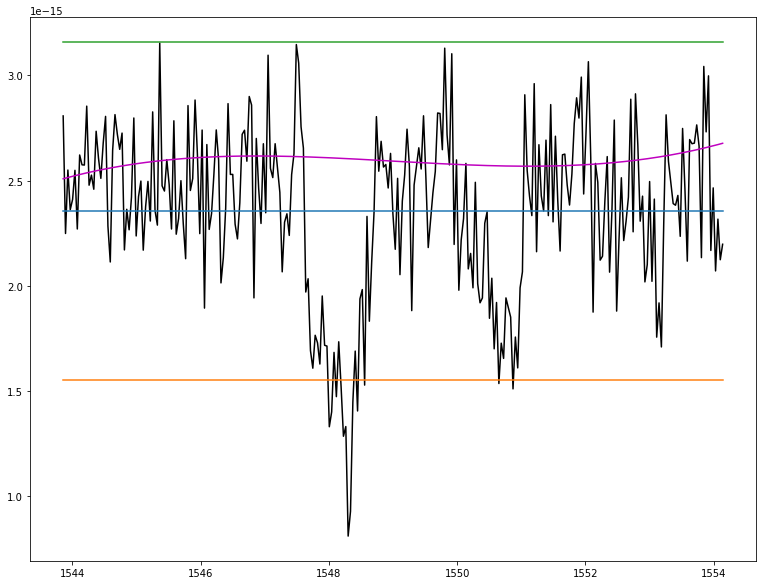

In [3]:
# idea is that we want to include the data points within 2 standard dieviations of the mean, and then when we
# find the new mean, it will be slightly higher, and do this until we only have data that is not a feature. 

plt.plot(wl,fl, 'k')
plt.plot(wl,ctn, 'm')
plt.plot(wl, [np.mean(fl)]*len(wl))
plt.plot(wl, [np.mean(fl)-2*np.std(fl)]*len(wl))
plt.plot(wl, [np.mean(fl)+2*np.std(fl)]*len(wl))


In [20]:
def continuum(wl, fl, ctn_given, name):
    plt.plot(wl, ctn_given, label='Given Continuum')
    plt.step(wl, fl, 'g-', lw=2, where='mid', label='Data')
    wl0 = wl
    for i in range(20):
        fl, wl = trim(wl, fl, 2)
    #for i in range(20):
        #fl, wl = trim(wl, fl, 1.75)
    p0 = [1e-15]*4
    p = curve_fit(func, wl ,fl, p0)
    plt.plot(wl,fl, 'k-', label='Trimmed Data')
    plt.plot(wl0, func(np.array(wl0), p[0][0], p[0][1], p[0][2], p[0][3]), 'r-', label='Fitted Continuum')
    plt.plot(wl0, (func(np.array(wl0), p[0][0], p[0][1], p[0][2], p[0][3]) + ctn_given)/2 , '-m', 
             label='Average Continuum')
    plt.xlabel('Wavelength [A]')
    plt.ylabel('Flux')
    plt.title(name)
    plt.legend()
    plt.show()

def trim(wl, fl, threshold):
    fl_new = []
    wl_new = []
    mean, std, i = np.mean(fl), np.std(fl), 0
    for f in fl:
        if f < mean + threshold*std and f > mean - threshold*std:
            fl_new.append(fl[i])
            wl_new.append(wl[i])
        i += 1
    return fl_new, wl_new

def func(x, a, b, c, d):
    return a*x**3 + b*x**2 + c*x + d

In [21]:
CIV = ['1ES1028+511', '1ES1553+113', '1H-2129-624', '1H1613-097', '2MASX-J16194054+2543233', '3C066A', '3C263',
       '3C48', '3C57', '4C-05.38', '4C-06.41', '4C25.01', '6C-092828+554656', 'B0117-2837', 'B0120-28', 'CSO-0873',
       'CTS487', 'ESO-141-55', 'ESO292-G24', 'FAIRALL9', 'FBQSJ1010+3003', 'FBS0150+396', 'FIRST-J020930.7-043826',
      'HB89-0107-025-NED05', 'HB89-0232-042', 'HE0056-3622', 'HE0153-4520', 'HE0226-4110', 'HE0238-1904', 'HE0439-5254',
      'HS1102+3441', 'ICRF-J122011.8+020342', 'IRAS-F04250-5718', 'IRAS-F22456-5125', 'IRAS-L06229-6434', 'IRASF00040+4325',
      'IZW1', 'J0246-0059', 'J0315-2143', 'J0321-1758', 'J1127+1154', 'J1156P1745', 'J213553.19-531655.7', 'J230837.73-525848.5',
      'LBQS-0107-0232', 'LBQS-0107-0235', 'LBQS-1435-0134', 'MARK509', 'MR2251-178', 'MRK-1044', 'MRK106', 'MRK1148', 
      'MRK1392', 'MRK1513', 'MRK290', 'MRK352', 'MRK421', 'MRK817', 'MRK841', 'MRK876', 'NGC-3516', 'NGC-3783', 'NGC-4051',
      'NGC-5548', 'NGC-7469', 'NGC-985', 'NGC7714', 'PDS456', 'PG-1338+416', 'PG-1522+101', 'PG-1630+377', 'PG0003+158',
      'PG0052+251', 'PG0804+761', 'PG0953+414', 'PG1001+291', 'PG1011-040', 'PG1048+342', 'PG1049-005', 'PG1115+407',
      'PG1116+215', 'PG1121+422', 'PG1126-041', 'PG1216+069', 'PG1222+216', 'PG1259+593', 'PG1352+183', 'PG1424+240',
      'PG1626+554', 'PHL1598', 'PHL1811', 'PHL2525', 'PKS0405-123', 'PKS0552-640', 'PKS0637-752', 'PKS1302-102',
      'PKS2005-489', 'PMNJ1103-2329', 'PMNJ2345-1555', 'Q0349-146', 'Q0850+440', 'Q1354+195', 'Q1545+210', 'Q2135-145',
      'Q2251+155', 'QSO-B0952+457', 'QSO-B1124+271', 'QSO-B1215+303', 'QSO-B1411+4414', 'QSO-B1435-0645', 'QSO0045+3926',
      'RBS144', 'RBS1666', 'RBS1892', 'RBS2000', 'RBS2005', 'RBS2055', 'RXJ0028.1+3103', 'RXJ0439.6-5311', 'RXJ1230.8+0115',
      'RXJ2154.1-4414', 'RXS-J00057-5007', 'RXS-J21388-3828', 'RXS-J23218-7026', 'RXSJ00437+3725', 'RXSJ00508+3536', 
      'S50716+714', 'SBS1108+560', 'SBS1122+594', 'SDSS-J100535.24+013445.7', 'SDSS-J135726.27+043541.4', 
      'SDSS-J141038.39+230447.1', 'SDSS-J141309.14+092011.2', 'SDSSJ080908.13+461925.6', 'SDSSJ085116.14+424328.8', 
      'SDSSJ085259.22+031320.6', 'SDSSJ092554.43+453544.4', 'SDSSJ092909.79+464424.0', 'SDSSJ094840.08+580039.1', 
      'SDSSJ100102.55+594414.3', 'SDSSJ105945.23+144142.9', 'SDSSJ123235.82+060310.0', 'SDSSJ133053.27+311930.5', 
       'SDSSJ134206.56+050523.8', 'SDSSJ135712.61+170444.1', 'SDSSJ161916.54+334238.4', 'TON236', 'TON580', 'TONS210', 
      'UKS-0242-724', 'VIIZW244', 'VV2006-J095240.2+515250', 'VV2006-J095243.0+515121', 'VV2006-J125901.7+413055']

In [24]:
# We see that the given continuum tends to overestimate the proper looking continuum, and mine 
# underestimates slightly, espesially for large features and uneven continuum, so we will also look 
# at the average of the two. 

def plot_continuum(name):
    path = 'CIV/' + name + '/CIV.bin3.linespec'
    wl, fl, fe, ctn = np.loadtxt(path).transpose()
    continuum(wl, fl, ctn, name)

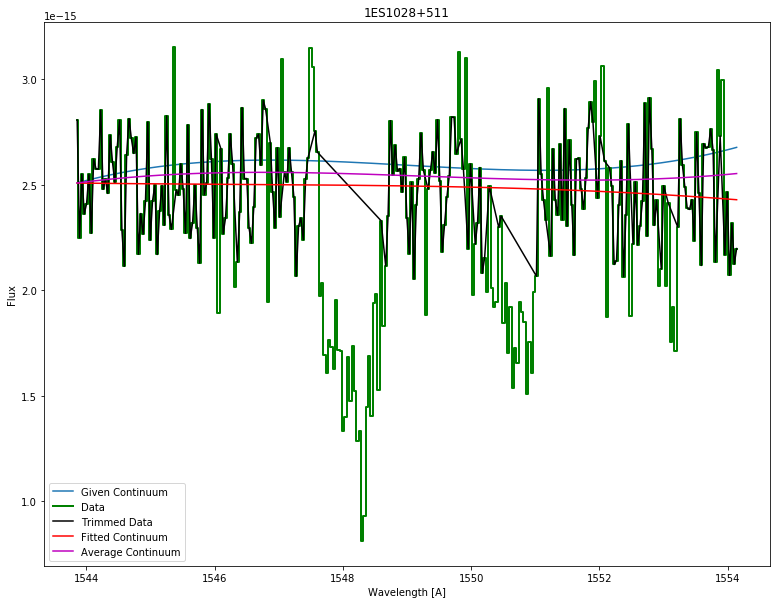

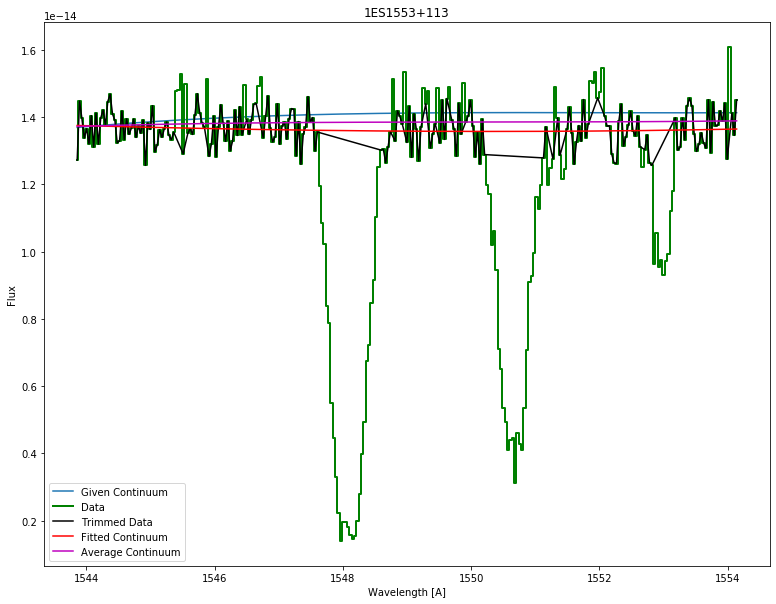

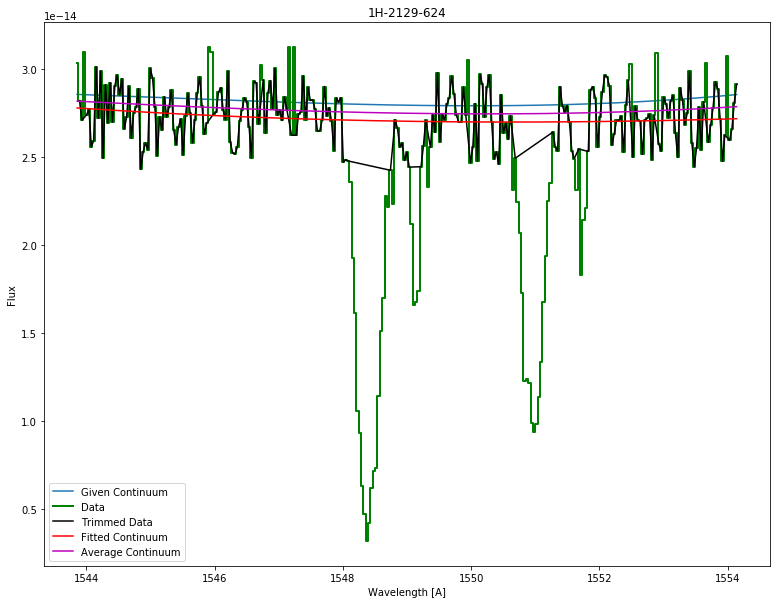

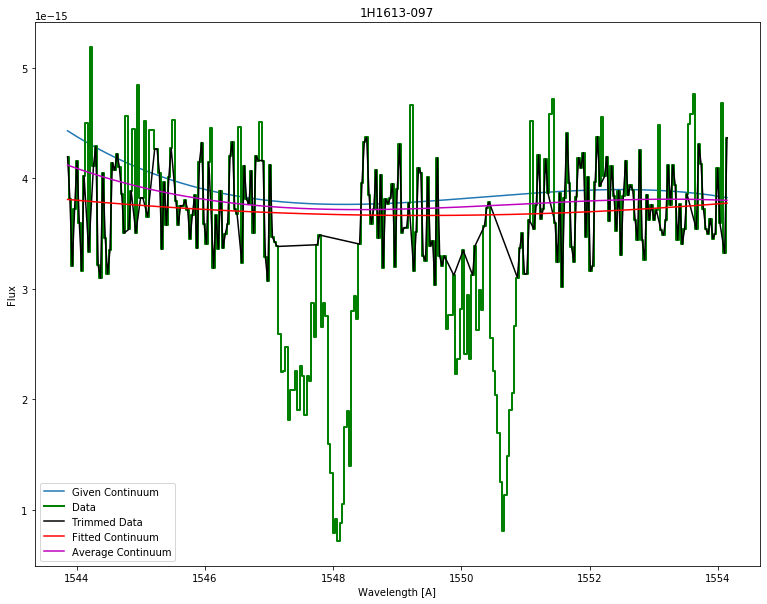

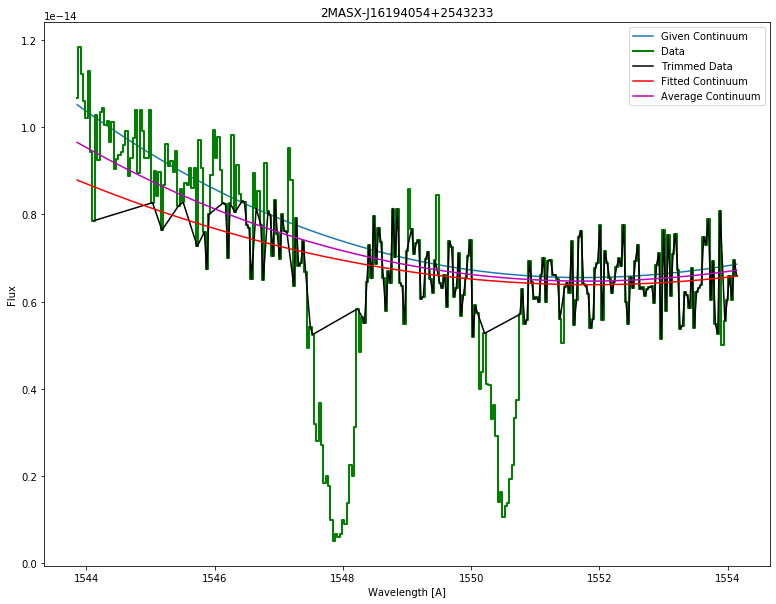

...

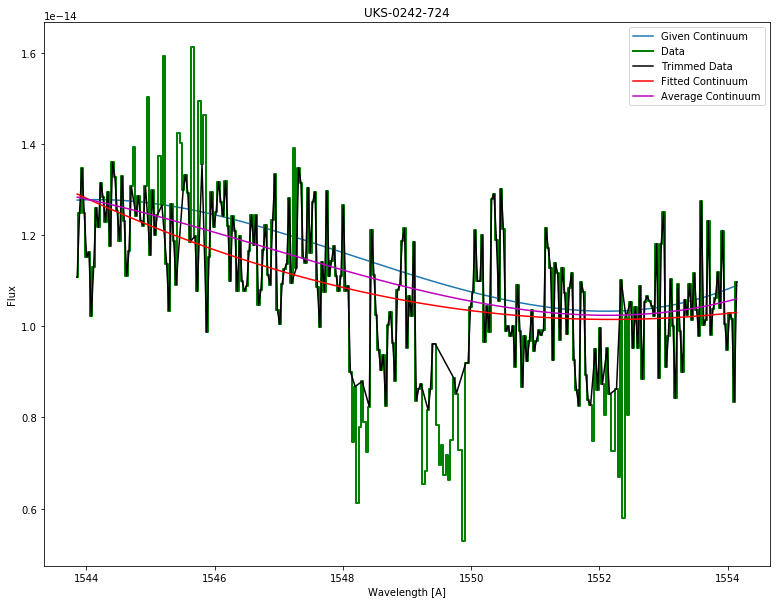

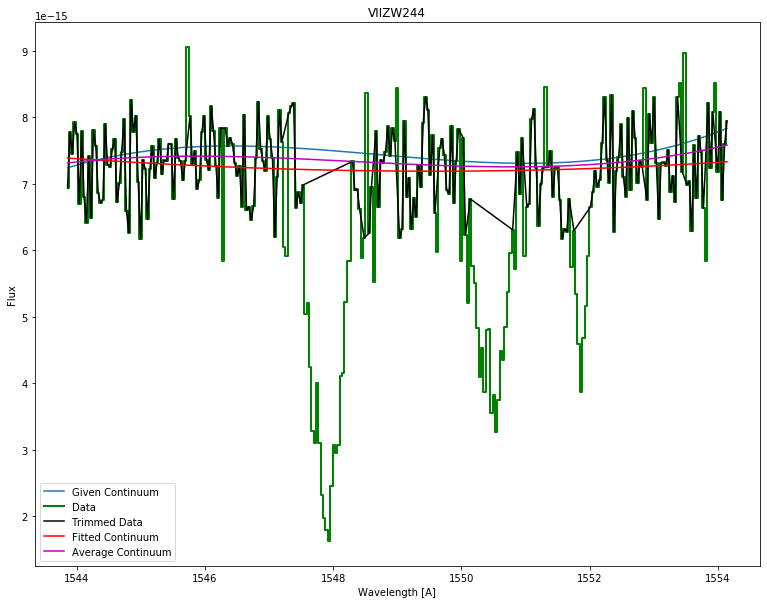

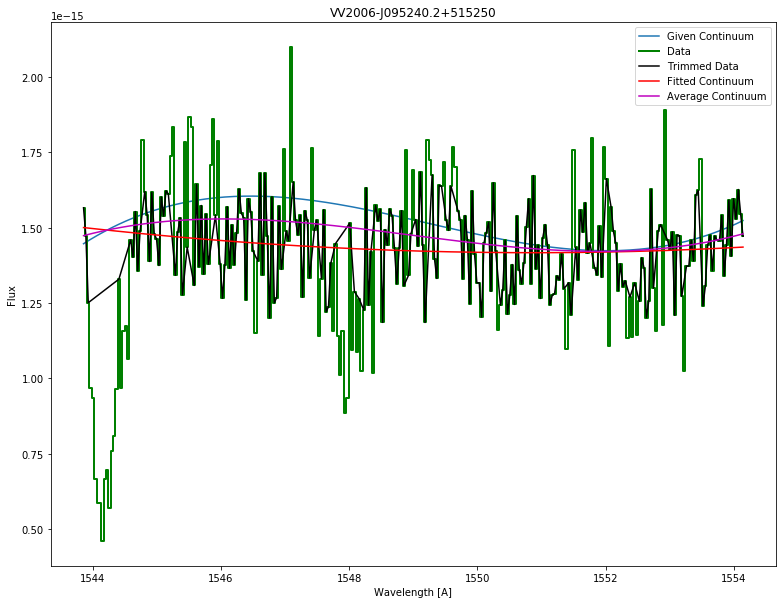

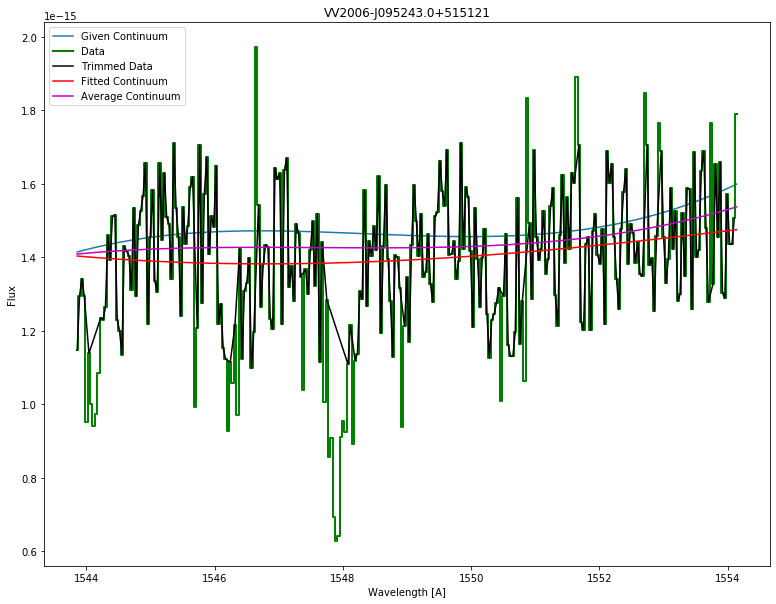

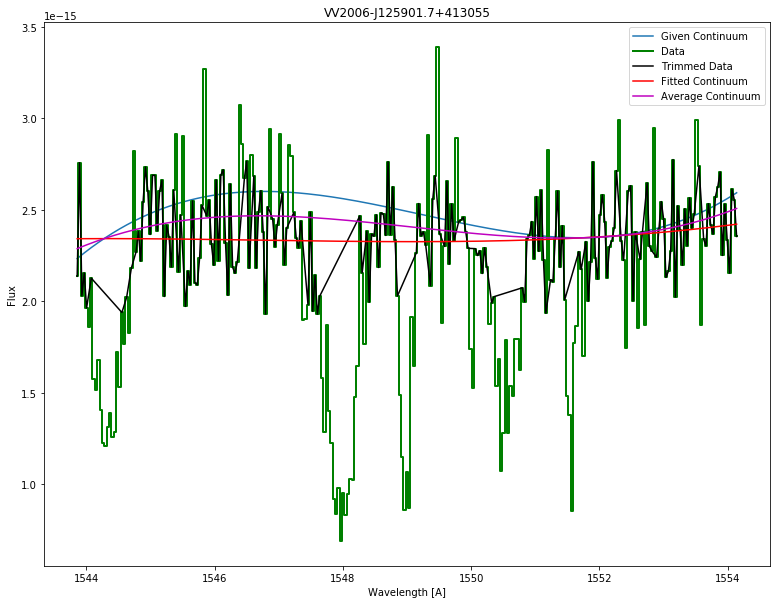

In [23]:
for c in CIV:
    plot_continuum(c)